In [67]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
from fastai.conv_learner import *
from fastai.dataset import *

from pathlib import Path
import json, pdb
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects

## Setup

In [3]:
PATH = Path('data/pascal')
trn_j = json.load((PATH / 'pascal_train2007.json').open())
IMAGES,ANNOTATIONS,CATEGORIES = ['images', 'annotations', 'categories']
FILE_NAME,ID,IMG_ID,CAT_ID,BBOX = 'file_name','id','image_id','category_id','bbox'

cats = dict((o[ID], o['name']) for o in trn_j[CATEGORIES])
trn_fns = dict((o[ID], o[FILE_NAME]) for o in trn_j[IMAGES])
trn_ids = [o[ID] for o in trn_j[IMAGES]]

JPEGS = 'VOCdevkit/VOC2007/JPEGImages'
IMG_PATH = PATH/JPEGS

In [4]:
def get_trn_anno():
    trn_anno = collections.defaultdict(lambda:[])
    for o in trn_j[ANNOTATIONS]:
        if not o['ignore']:
            bb = o[BBOX]
            bb = np.array([bb[1], bb[0], bb[3]+bb[1]-1, bb[2]+bb[0]-1])
            trn_anno[o[IMG_ID]].append((bb,o[CAT_ID]))
    return trn_anno

trn_anno = get_trn_anno()

In [5]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.set_xticks(np.linspace(0, 224, 8))
    ax.set_yticks(np.linspace(0, 224, 8))
    ax.grid()
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    return ax

def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)

In [6]:
def bb_hw(a): return np.array([a[1],a[0],a[3]-a[1],a[2]-a[0]])

def draw_im(im, ann):
    ax = show_img(im, figsize=(16,8))
    for b,c in ann:
        b = bb_hw(b)
        draw_rect(ax, b)
        draw_text(ax, b[:2], cats[c], sz=16)

def draw_idx(i):
    im_a = trn_anno[i]
    im = open_image(IMG_PATH/trn_fns[i])
    draw_im(im, im_a)

## Multi class

In [68]:
MC_CSV = PATH/'tmp/mc.csv'

In [69]:
trn_anno[12]

[(array([ 96, 155, 269, 350]), 7)]

In [70]:
mc = [set([cats[p[1]] for p in trn_anno[o]]) for o in trn_ids]
mcs = [' '.join(str(p) for p in o) for o in mc]

In [71]:
df = pd.DataFrame({'fn': [trn_fns[o] for o in trn_ids], 'clas': mcs}, columns=['fn','clas'])
df.to_csv(MC_CSV, index=False)

In [72]:
f_model=resnet34
sz=224
bs=64

In [83]:
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO)
md = ImageClassifierData.from_csv(PATH, JPEGS, MC_CSV, tfms=tfms)

In [84]:
x,y=next(iter(md.val_dl))

In [89]:
learn = ConvLearner.pretrained(f_model, md)
learn.opt_fn = optim.Adam

In [125]:
lrf=learn.lr_find(1e-5,100)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss   <lambda>                                                                              
    0      1.472438   10.808105  0.608842  



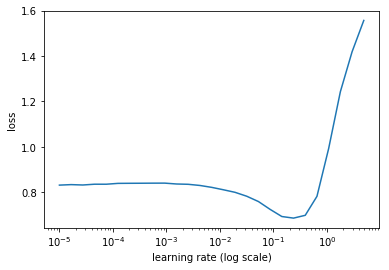

In [92]:
learn.sched.plot(0)

In [87]:
lr = 2e-2

In [91]:
learn.fit(lr, 1, cycle_len=3, use_clr=(32,5))

A Jupyter Widget

epoch      trn_loss   val_loss   <lambda>                  
    0      0.104836   0.085015   0.972356  
    1      0.088193   0.079739   0.972461                   
    2      0.072346   0.077259   0.974114                   



[0.077258907, 0.9741135761141777]

In [92]:
lrs = np.array([lr/100, lr/10, lr])

In [93]:
learn.freeze_to(-2)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 81%|█████████████████████████████████████████████████████████▋             | 26/32 [00:22<00:05,  1.15it/s, loss=0.33]

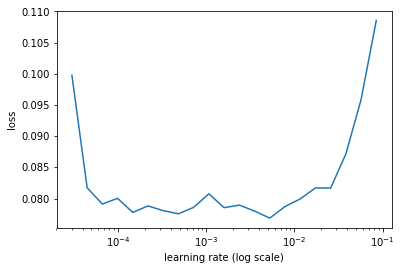

In [135]:
learn.lr_find(lrs/1000)
learn.sched.plot(0)

In [94]:
learn.fit(lrs/10, 1, cycle_len=5, use_clr=(32,5))

A Jupyter Widget

epoch      trn_loss   val_loss   <lambda>                   
    0      0.063236   0.088847   0.970681  
    1      0.049675   0.079885   0.973723                   
    2      0.03693    0.076906   0.975601                   
    3      0.026645   0.075304   0.976187                   
    4      0.018805   0.074934   0.975165                   



[0.074934497, 0.97516526281833649]

In [95]:
learn.save('mclas')

In [96]:
learn.load('mclas')

In [97]:
y = learn.predict()
x,_ = next(iter(md.val_dl))
x = to_np(x)

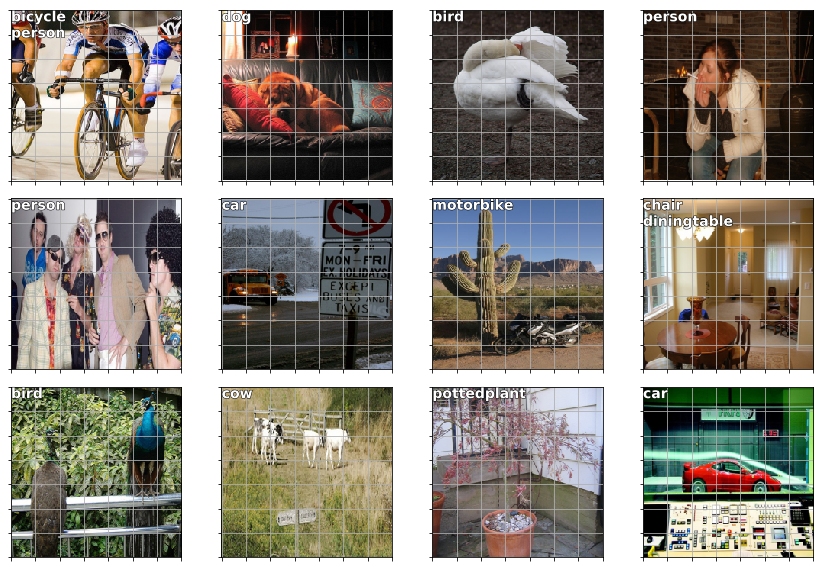

In [99]:
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(x)[i]
    ya = np.nonzero(y[i]>0.4)[0]
    b = '\n'.join(md.classes[o] for o in ya)
    ax = show_img(ima, ax=ax)
    draw_text(ax, (0,0), b)
plt.tight_layout()

## Bbox per cell

### Set up data

In [7]:
CLAS_CSV = PATH/'tmp/clas.csv'
MBB_CSV = PATH/'tmp/mbb.csv'

f_model=resnet34
sz=224
bs=64

In [8]:
mc = [[cats[p[1]] for p in trn_anno[o]] for o in trn_ids]
id2cat = list(cats.values())
cat2id = {v:k for k,v in enumerate(id2cat)}
mcs = np.array([np.array([cat2id[p] for p in o]) for o in mc]); mcs

array([array([6]), array([14, 12]), array([ 1,  1, 14, 14, 14]), ..., array([17,  8, 14, 14, 14]), array([6]),
       array([11])], dtype=object)

In [9]:
val_idxs = get_cv_idxs(len(trn_fns))
((val_mcs,trn_mcs),) = split_by_idx(val_idxs, mcs)

In [10]:
mbb = [np.concatenate([p[0] for p in trn_anno[o]]) for o in trn_ids]
mbbs = [' '.join(str(p) for p in o) for o in mbb]

df = pd.DataFrame({'fn': [trn_fns[o] for o in trn_ids], 'bbox': mbbs}, columns=['fn','bbox'])
df.to_csv(MBB_CSV, index=False)

In [11]:
aug_tfms = [RandomRotate(10, tfm_y=TfmType.COORD),
            RandomLighting(0.05, 0.05, tfm_y=TfmType.COORD),
            RandomFlip(tfm_y=TfmType.COORD)]
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, aug_tfms=aug_tfms)
md = ImageClassifierData.from_csv(PATH, JPEGS, MBB_CSV, tfms=tfms, continuous=True, num_workers=4)

In [12]:
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

def get_cmap(N):
    color_norm  = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_colr = 12
cmap = get_cmap(num_colr)
colr_list = [cmap(float(x)) for x in range(num_colr)]

In [13]:
def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [bb_hw(o) for o in bbox.reshape(-1,4)]
    if prs is None:  prs  = [None]*len(bb)
    if clas is None: clas = [None]*len(bb)
    ax = show_img(im, ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb, clas, prs)):
        if((b[2]>0) and (pr is None or pr > thresh)):
            draw_rect(ax, b, color=colr_list[i%num_colr])
            txt = f'{i}: '
            if c is not None: txt += ('bg' if c==len(id2cat) else id2cat[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=colr_list[i%num_colr])

In [14]:
class ConcatLblDataset(Dataset):
    def __init__(self, ds, y2):
        self.ds,self.y2 = ds,y2
        self.sz = ds.sz
    def __len__(self): return len(self.ds)
    
    def __getitem__(self, i):
        x,y = self.ds[i]
        return (x, (y,self.y2[i]))

In [15]:
trn_ds2 = ConcatLblDataset(md.trn_ds, trn_mcs)
val_ds2 = ConcatLblDataset(md.val_ds, val_mcs)
md.trn_dl.dataset = trn_ds2
md.val_dl.dataset = val_ds2

In [16]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

In [17]:
x,y=to_np(next(iter(md.trn_dl)))
x=md.trn_ds.ds.denorm(x)

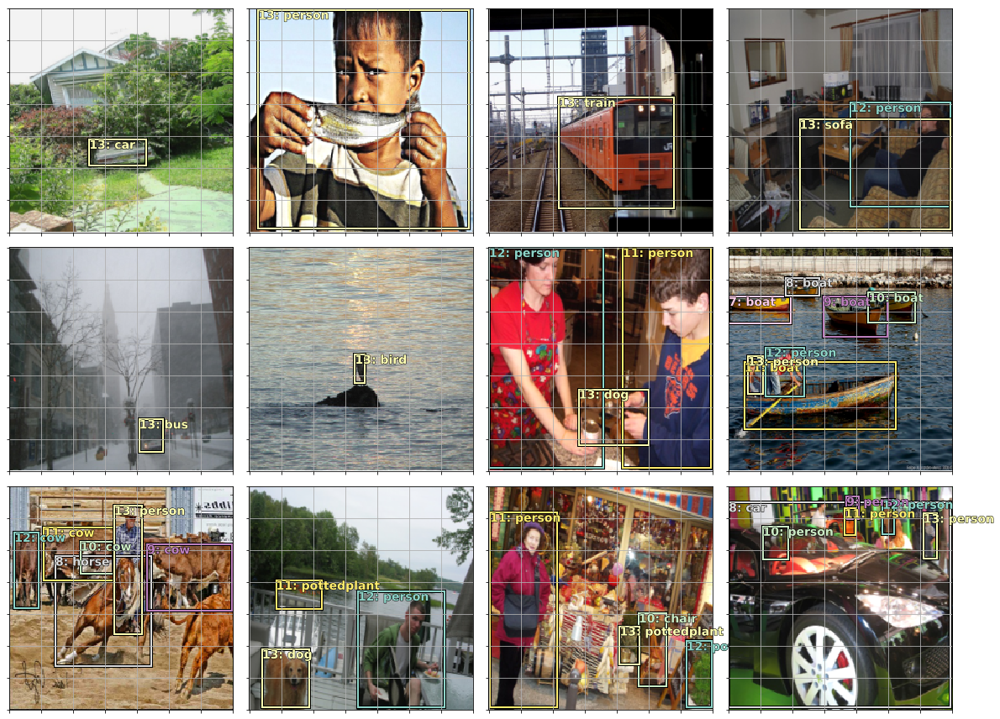

In [18]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for i,ax in enumerate(axes.flat):
    show_ground_truth(ax, x[i], y[0][i], y[1][i])
plt.tight_layout()

### Set up model

In [16]:
anc_grid = 2
k = 1

anc_offset = 1/(anc_grid*2)
anc_x = np.tile(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)
anc_y = np.repeat(np.linspace(anc_offset, 1-anc_offset, anc_grid), anc_grid)

anc_ctrs = np.tile(np.stack([anc_x,anc_y], axis=1), (k,1))
anc_sizes = np.array([[1/anc_grid,1/anc_grid] for i in range(anc_grid*anc_grid)])
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()

In [17]:
grid_sizes = V(np.array([1/anc_grid]), requires_grad=False).unsqueeze(1)

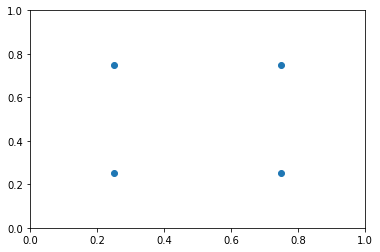

In [18]:
plt.scatter(anc_x, anc_y)
plt.xlim(0, 1)
plt.ylim(0, 1);

In [19]:
anchors

Variable containing:
 0.2500  0.2500  0.5000  0.5000
 0.7500  0.2500  0.5000  0.5000
 0.2500  0.7500  0.5000  0.5000
 0.7500  0.7500  0.5000  0.5000
[torch.cuda.FloatTensor of size 4x4 (GPU 0)]

In [20]:
def hw2corners(ctr, hw): return torch.cat([ctr-hw/2, ctr+hw/2], dim=1)

In [21]:
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [22]:
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

def jaccard(box_a, box_b):
    inter = intersect(box_a, box_b)
    union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
    return inter / union

In [23]:
n_clas = len(id2cat)+1
n_act = k*(4+n_clas)

In [24]:
class StdConv(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x): return self.drop(self.bn(F.relu(self.conv(x))))
        
def flatten_conv(x,k): return x.view(x.size(0),x.size(1)//k,-1).transpose(1,2)

In [25]:
class OutConv(nn.Module):
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (len(id2cat)+1)*k, 3, padding=1)
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]

In [35]:
class SSD_Head(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(0.25)
        self.sconv0 = StdConv(512,256, stride=1)
        self.sconv1 = StdConv(256,256)
        self.sconv2 = StdConv(256,256)
        self.out = OutConv(k, 256, bias)
        
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        x = self.sconv2(x)
        return self.out(x)

head_reg4 = SSD_Head(k, -3.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam
k

1

### Train

In [27]:
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None

loss_f = BCE_Loss(len(id2cat))

In [28]:
def get_y(bbox,clas):
    bbox = bbox.view(-1,4)/sz
    bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]
    return bbox[bb_keep],clas[bb_keep]

def actn_to_bb(actn, anchors):
    actn_bbs = torch.tanh(actn)
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2]
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:]
    return hw2corners(actn_centers, actn_hw)

def map_to_ground_truth(overlaps, print_it=False):
    prior_overlap, prior_idx = overlaps.max(1)
    if print_it: print(prior_overlap)
#     pdb.set_trace()
    gt_overlap, gt_idx = overlaps.max(0)
    gt_overlap[prior_idx] = 1.99
    for i,o in enumerate(prior_idx): gt_idx[o] = i
    return gt_overlap,gt_idx

def ssd_1_loss(b_c,b_bb,bbox,clas,print_it=False):
    bbox,clas = get_y(bbox,clas)
    a_ic = actn_to_bb(b_bb, anchors)
    overlaps = jaccard(bbox.data, anchor_cnr.data)
    gt_overlap,gt_idx = map_to_ground_truth(overlaps,print_it)
    gt_clas = clas[gt_idx]
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    gt_clas[1-pos] = len(id2cat)
    gt_bbox = bbox[gt_idx]
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    clas_loss  = loss_f(b_c, gt_clas)
    return loc_loss, clas_loss

def ssd_loss(pred,targ,print_it=False):
    lcs,lls = 0.,0.
    for b_c,b_bb,bbox,clas in zip(*pred,*targ):
        loc_loss,clas_loss = ssd_1_loss(b_c,b_bb,bbox,clas,print_it)
        lls += loc_loss
        lcs += clas_loss
    if print_it: print(lls,lcs)
    return lls+lcs

In [29]:
x,y = next(iter(md.val_dl))
# x,y = V(x).cpu(),V(y)
x,y = V(x),V(y)

In [ ]:
for i,o in enumerate(y): y[i] = o.cpu()
learn.model.cpu()

In [30]:
batch = learn.model(x)

In [59]:
anchors = anchors.cpu(); grid_sizes = grid_sizes.cpu(); anchor_cnr = anchor_cnr.cpu()

In [31]:
ssd_loss(batch, y, True)


 0.3366
 0.2396
 0.3091
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.1744
 0.3427
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.2400
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.2594
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.2220
 0.4570
 0.2867
 0.3480
 0.2990
 0.0255
 0.0359
[torch.cuda.FloatTensor of size 7 (GPU 0)]


 0.1583
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.3744
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.1537
 0.4426
 0.0474
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.3093
 0.3393
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.1483
 0.0860
 0.1447
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.2483
 0.1152
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.1104
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7722
 0.2625
 0.6392
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.2894
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.2610
 0.2213
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3191
 0.0143
[torch.cuda.FloatTensor of size 2 (GPU 0)]



Variable containing:
 41.9969
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [36]:
learn.crit = ssd_loss
lr = 3e-3
lrs = np.array([lr/100,lr/10,lr])

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      41.855821  1295.334595



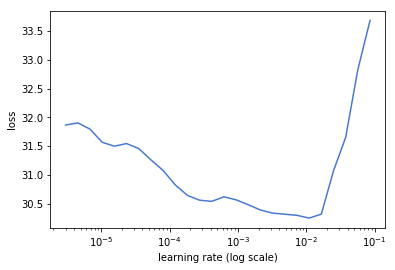

In [155]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(1)

In [37]:
learn.fit(lr, 1, cycle_len=1, use_clr=(20,3))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      28.810398  24.736069 



[24.736069]

In [38]:
learn.fit(lr, 1, cycle_len=5, use_clr=(20,10))

A Jupyter Widget

epoch      trn_loss   val_loss                            
    0      24.422395  25.839237 
    1      22.816337  21.826944                           
    2      21.165074  20.552837                           
    3      19.719464  20.083046                           
    4      18.588824  19.499802                           



[19.499802]

In [39]:
learn.save('0')

### Testing

In [40]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
learn.model.eval()
batch = learn.model(V(x))
b_clas,b_bb = batch

In [41]:
b_clas.size(),b_bb.size()

(torch.Size([64, 4, 21]), torch.Size([64, 4, 4]))

In [42]:
idx=7
b_clasi = b_clas[idx]
b_bboxi = b_bb[idx]
ima=md.val_ds.ds.denorm(to_np(x))[idx]
bbox,clas = get_y(y[0][idx], y[1][idx])
bbox,clas

(Variable containing:
  0.6786  0.4866  0.9911  0.6250
  0.7098  0.0848  0.9911  0.5491
  0.5134  0.8304  0.6696  0.9063
 [torch.cuda.FloatTensor of size 3x4 (GPU 0)], Variable containing:
   8
  10
  17
 [torch.cuda.LongTensor of size 3 (GPU 0)])

In [43]:
def torch_gt(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return show_ground_truth(ax, ima, to_np((bbox*224).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)

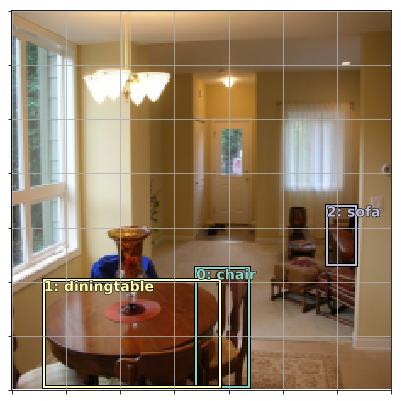

In [44]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, bbox, clas)

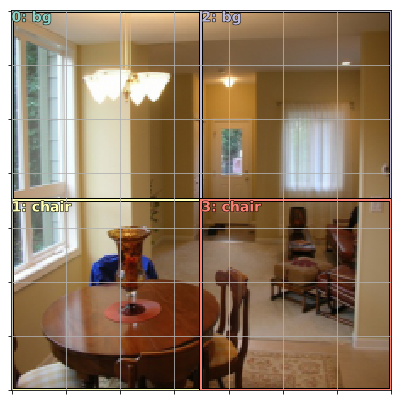

In [45]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, anchor_cnr, b_clasi.max(1)[1])

In [46]:
a_ic = actn_to_bb(b_bboxi, anchors)

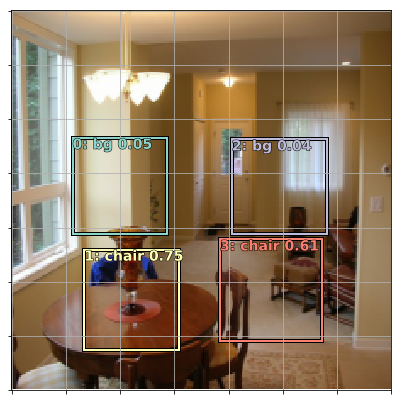

In [47]:
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, a_ic, b_clasi.max(1)[1], b_clasi.max(1)[0].sigmoid(), thresh=0.0)

In [48]:
overlaps = jaccard(bbox.data, anchor_cnr.data)
overlaps


 0.0000  0.0145  0.0000  0.1537
 0.0000  0.4426  0.0000  0.0377
 0.0000  0.0000  0.0000  0.0474
[torch.cuda.FloatTensor of size 3x4 (GPU 0)]

In [49]:
overlaps.max(1)

(
  0.1537
  0.4426
  0.0474
 [torch.cuda.FloatTensor of size 3 (GPU 0)], 
  3
  1
  3
 [torch.cuda.LongTensor of size 3 (GPU 0)])

In [50]:
overlaps.max(0)

(
  0.0000
  0.4426
  0.0000
  0.1537
 [torch.cuda.FloatTensor of size 4 (GPU 0)], 
  0
  1
  0
  0
 [torch.cuda.LongTensor of size 4 (GPU 0)])

In [51]:
gt_overlap,gt_idx = map_to_ground_truth(overlaps)
gt_overlap,gt_idx

(
  0.0000
  1.9900
  0.0000
  1.9900
 [torch.cuda.FloatTensor of size 4 (GPU 0)], 
  0
  1
  0
  2
 [torch.cuda.LongTensor of size 4 (GPU 0)])

In [61]:
gt_clas = clas[gt_idx]; gt_clas

Variable containing:
  8
 10
  8
 17
[torch.cuda.LongTensor of size 4 (GPU 0)]

In [62]:
thresh = 0.35
pos = gt_overlap > thresh
pos_idx = torch.nonzero(pos)[:,0]
neg_idx = torch.nonzero(1-pos)[:,0]
pos_idx


 1
 3
[torch.cuda.LongTensor of size 2 (GPU 0)]

In [63]:
gt_clas[neg_idx] = len(id2cat)
[id2cat[o] if o<len(id2cat) else 'bg' for o in gt_clas.data]

['bg', 'diningtable', 'bg', 'sofa']

In [64]:
gt_bbox = bbox[gt_idx]
loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
clas_loss  = F.cross_entropy(b_clasi, gt_clas)
loc_loss,clas_loss

(Variable containing:
  0.1312
 [torch.cuda.FloatTensor of size 1 (GPU 0)], Variable containing:
  2.2958
 [torch.cuda.FloatTensor of size 1 (GPU 0)])

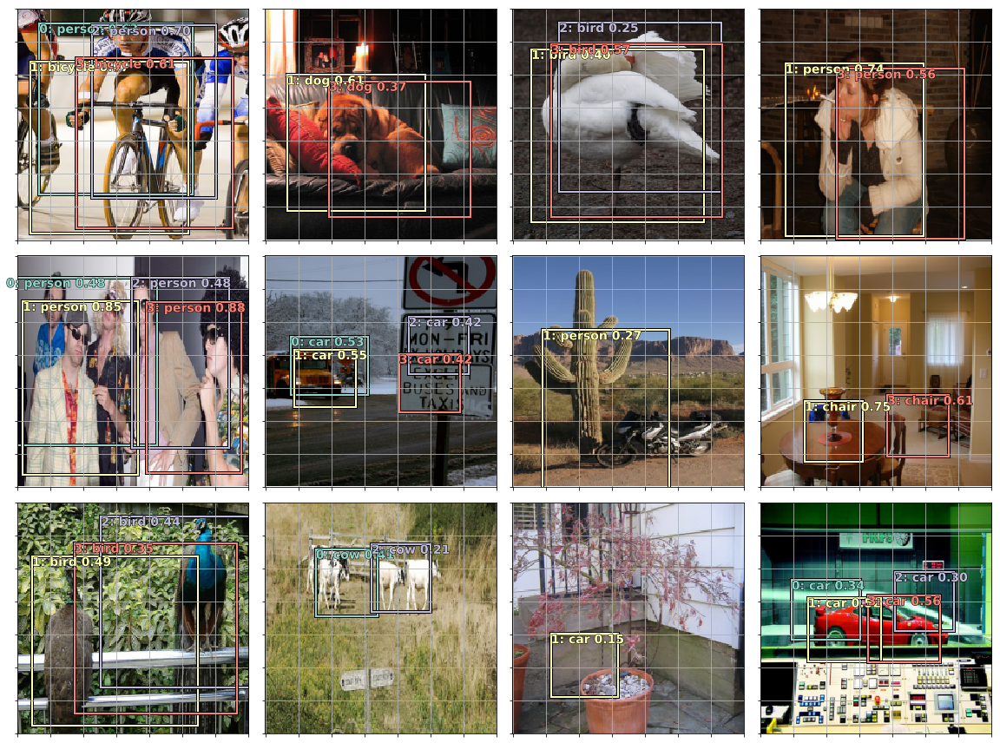

In [65]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(bbox,clas); bbox,clas
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.15)
plt.tight_layout()

## More anchors!

### Create anchors

In [32]:
anc_grids = [4,2,1]
# anc_grids = [1]
anc_zooms = [0.75, 1., 1.3]
# anc_zooms = [1.]
anc_ratios = [(1.,1.), (1.,0.5), (0.5,1.)]
# anc_ratios = [(1.,1.)]
anchor_scales = [(anz*i,anz*j) for anz in anc_zooms for (i,j) in anc_ratios]
k = len(anchor_scales)
anc_offsets = [1/(o*2) for o in anc_grids]

In [33]:
anc_x = np.concatenate([np.tile(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_y = np.concatenate([np.repeat(np.linspace(ao, 1-ao, ag), ag)
                        for ao,ag in zip(anc_offsets,anc_grids)])
anc_ctrs = np.repeat(np.stack([anc_x,anc_y], axis=1), k, axis=0)

In [34]:
anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids])
grid_sizes = V(np.concatenate([np.array([ 1/ag       for i in range(ag*ag) for o,p in anchor_scales])
               for ag in anc_grids]), requires_grad=False).unsqueeze(1)
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()
anchor_cnr = hw2corners(anchors[:,:2], anchors[:,2:])

In [35]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

In [61]:
a=np.reshape((to_np(anchor_cnr) + to_np(torch.randn(*anchor_cnr.size()))*0.01)*224, -1)

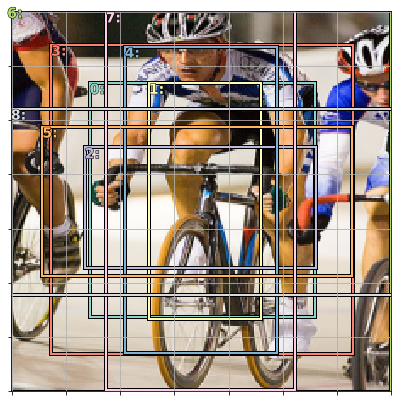

In [495]:
fig, ax = plt.subplots(figsize=(7,7))
show_ground_truth(ax, x[0], a)

### Model

In [36]:
drop=0.4

class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(drop)
        self.sconv1 = StdConv(512,256, drop=drop)
        self.sconv2 = StdConv(256,256, drop=drop)
        self.sconv3 = StdConv(256,256, drop=drop)
        self.out0 = OutConv(k, 256, bias)
        self.out1 = OutConv(k, 256, bias)
        self.out2 = OutConv(k, 256, bias)
        self.out3 = OutConv(k, 256, bias)

    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv1(x)
        o1c,o1l = self.out1(x)
        x = self.sconv2(x)
        o2c,o2l = self.out2(x)
        x = self.sconv3(x)
        o3c,o3l = self.out3(x)
        return [torch.cat([o1c,o2c,o3c], dim=1),
                torch.cat([o1l,o2l,o3l], dim=1)]

head_reg4 = SSD_MultiHead(k, -4.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam

learn.crit = ssd_loss
lr = 2e-3
lrs = np.array([lr/100,lr/10,lr])

In [63]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(V(x))

In [64]:
batch[0].size(),batch[1].size()

(torch.Size([64, 189, 21]), torch.Size([64, 189, 4]))

In [65]:
ssd_loss(batch, y, True)


 0.5594
 0.7821
 0.3192
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.5920
 0.7155
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.8666
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7435
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5317
 0.4788
 0.4055
 0.5144
 0.3101
 0.1097
 0.1333
[torch.cuda.FloatTensor of size 7 (GPU 0)]


 0.3766
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5396
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.4194
 0.6042
 0.6029
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.4430
 0.5300
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3569
 0.3476
 0.5266
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.9866
 0.2667
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.4177
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7742
 0.5290
 0.6588
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.7616
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.4659
 0.8338
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.6822
 0.1824
[torch.cuda.FloatTensor of size 2 (GPU 0)]



Variable containing:
 337.5916
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [136]:
learn.lr_find(lrs/1000,1.)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

 94%|███████████████████████████████████████████████████████████████████▌    | 30/32 [00:53<00:03,  1.77s/it, loss=480]

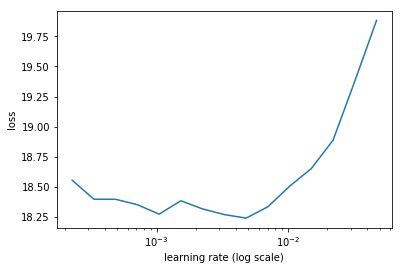

In [137]:
learn.sched.plot()

In [130]:
learn.fit(lrs, 1, cycle_len=1, use_clr=(10,2))

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

  0%|                                                                                           | 0/32 [00:00<?, ?it/s]


Exception in thread Thread-60:
Traceback (most recent call last):
  File "C:\Users\j\Anaconda3\envs\fastai\lib\threading.py", line 916, in _bootstrap_inner
    self.run()
  File "C:\Users\j\Anaconda3\envs\fastai\lib\site-packages\tqdm\_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "C:\Users\j\Anaconda3\envs\fastai\lib\_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration



epoch      trn_loss   val_loss                                                                                         
    0      25.80226   20.778721 



[20.77872]

In [370]:
learn.fit(lrs, 1, cycle_len=8, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=8), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      86.120302  87.348297 
    1      81.478525  79.10553                                                                                         
    2      76.020008  74.032501                                                                                        
    3      71.167289  70.217361                                                                                        
    4      66.749425  68.366455                                                                                        
    5      62.550723  66.210106                                                                                        
    6      59.152911  64.591156                                                                                        
    7      56.248234  63.360603                                                                                        



[63.360603]

In [371]:
learn.save('tmp')

In [373]:
learn.freeze_to(-2)
learn.fit(lr, 1, cycle_len=10, use_clr=(10,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      63.40004   110.712814
    1      65.978227  99.409355                                                                                        
    2      64.419958  69.094055                                                                                        
    3      61.511615  68.682999                                                                                        
    4      58.273493  66.503235                                                                                        
    5      55.195502  65.400146                                                                                        
    6      52.029294  63.787411                                                                                        
    7      48.869376  63.335697                                                                                        
    8  

[60.480648]

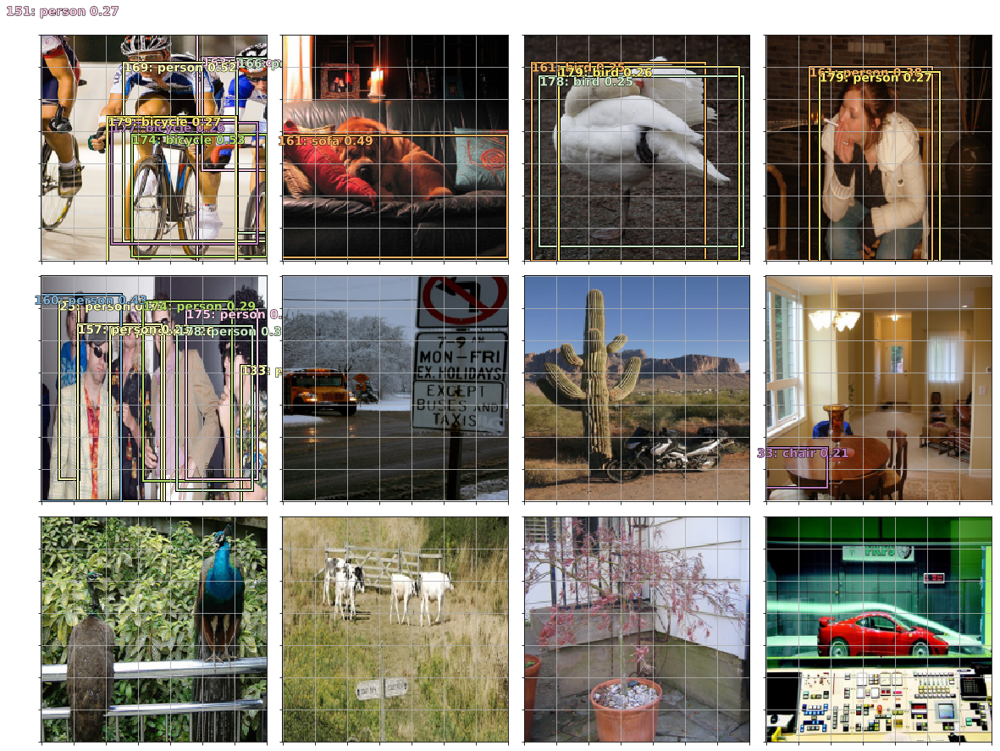

In [374]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.2)
plt.tight_layout()

### Focal loss

In [37]:
def plot_results(thresh):
    x,y = next(iter(md.val_dl))
    y = V(y)
    batch = learn.model(V(x))
    b_clas,b_bb = batch

    x = to_np(x)
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    for idx,ax in enumerate(axes.flat):
        ima=md.val_ds.ds.denorm(x)[idx]
        bbox,clas = get_y(y[0][idx], y[1][idx])
        a_ic = actn_to_bb(b_bb[idx], anchors)
        clas_pr, clas_ids = b_clas[idx].max(1)
        clas_pr = clas_pr.sigmoid()
        torch_gt(ax, ima, a_ic, clas_ids, clas_pr, clas_pr.max().data[0]*thresh)
    plt.tight_layout()

In [38]:
class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,2.
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

loss_f = FocalLoss(len(id2cat))

In [68]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(x)
ssd_loss(batch, y, True)


 0.5594
 0.7821
 0.3192
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.5920
 0.7155
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.8666
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7435
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5317
 0.4788
 0.4055
 0.5144
 0.3101
 0.1097
 0.1333
[torch.cuda.FloatTensor of size 7 (GPU 0)]


 0.3766
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.5396
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.4194
 0.6042
 0.6029
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.4430
 0.5300
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.3569
 0.3476
 0.5266
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.9866
 0.2667
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.4177
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.7742
 0.5290
 0.6588
[torch.cuda.FloatTensor of size 3 (GPU 0)]


 0.7616
[torch.cuda.FloatTensor of size 1 (GPU 0)]


 0.4659
 0.8338
[torch.cuda.FloatTensor of size 2 (GPU 0)]


 0.6822
 0.1824
[torch.cuda.FloatTensor of size 2 (GPU 0)]



Variable containing:
 30.6937
[torch.cuda.FloatTensor of size 1 (GPU 0)]

In [69]:
learn.fit(lrs, 1, cycle_len=1, use_clr=(20,3))

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      27.443137  23.294718 



[23.294718]

In [70]:
learn.fit(lrs, 1, cycle_len=8, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=8), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      20.838904  17.688156 
    1      17.655354  15.106363                                                                                        
    2      16.01816   14.220242                                                                                        
    3      14.727699  13.734037                                                                                        
    4      13.753461  13.286221                                                                                        
    5      13.05603   12.903882                                                                                        
    6      12.450726  12.80545                                                                                         
    7      11.965644  12.656506                                                                                        



[12.656506]

In [71]:
learn.save('fl0')

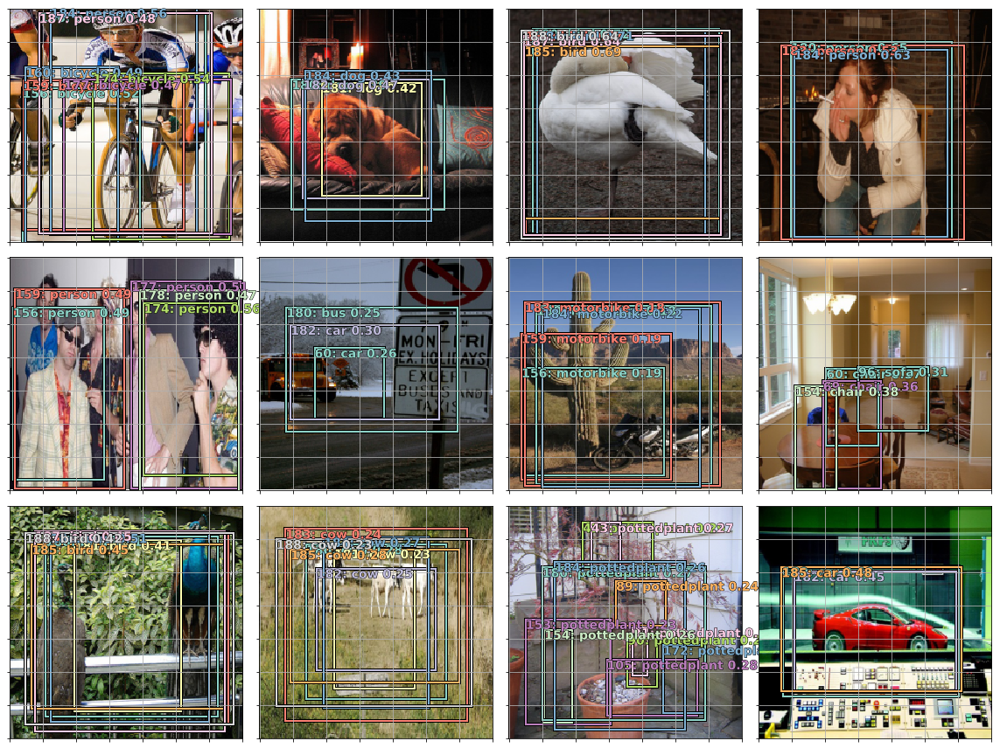

In [72]:
plot_results(0.8)

In [73]:
learn.freeze_to(-2)
learn.fit(lrs/2, 1, cycle_len=10, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      11.779697  12.86965  
    1      11.697548  12.776457                                                                                        
    2      11.417777  12.604932                                                                                        
    3      11.040084  12.400982                                                                                        
    4      10.672085  12.031542                                                                                        
    5      10.325896  12.006323                                                                                        
    6      10.025468  11.875763                                                                                        
    7      9.666479   11.808187                                                                                        
    8  

[11.685545]

In [112]:
learn.freeze_to(-2)
learn.fit(lrs/4, 1, cycle_len=10, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      9.034585   11.891396 
    1      9.087011   11.873768                                                                                        
    2      9.02608    11.87599                                                                                         
    3      8.93426    11.781538                                                                                        
    4      8.825759   11.746197                                                                                        
    5      8.716899   11.675211                                                                                        
    6      8.551062   11.591934                                                                                        
    7      8.44496    11.533642                                                                                        
    8  

[11.529757]

In [164]:
learn.save('drop4')

In [39]:
learn.load('drop4')

In [40]:
learn.unfreeze()
learn.fit(lrs/4, 1, cycle_len=10, use_clr=(20,10))

HBox(children=(IntProgress(value=0, description='Epoch', max=10), HTML(value='')))

epoch      trn_loss   val_loss                                                                                         
    0      8.207191   11.783035 
    1      8.246271   11.854383                                                                                        
    2      8.270361   11.779552                                                                                        
    3      8.224936   11.75123                                                                                         
    4      8.202758   11.62597                                                                                         
    5      8.090048   11.58369                                                                                         
    6      8.026234   11.623518                                                                                        
    7      7.928645   11.568427                                                                                        
    8  

[11.570904]

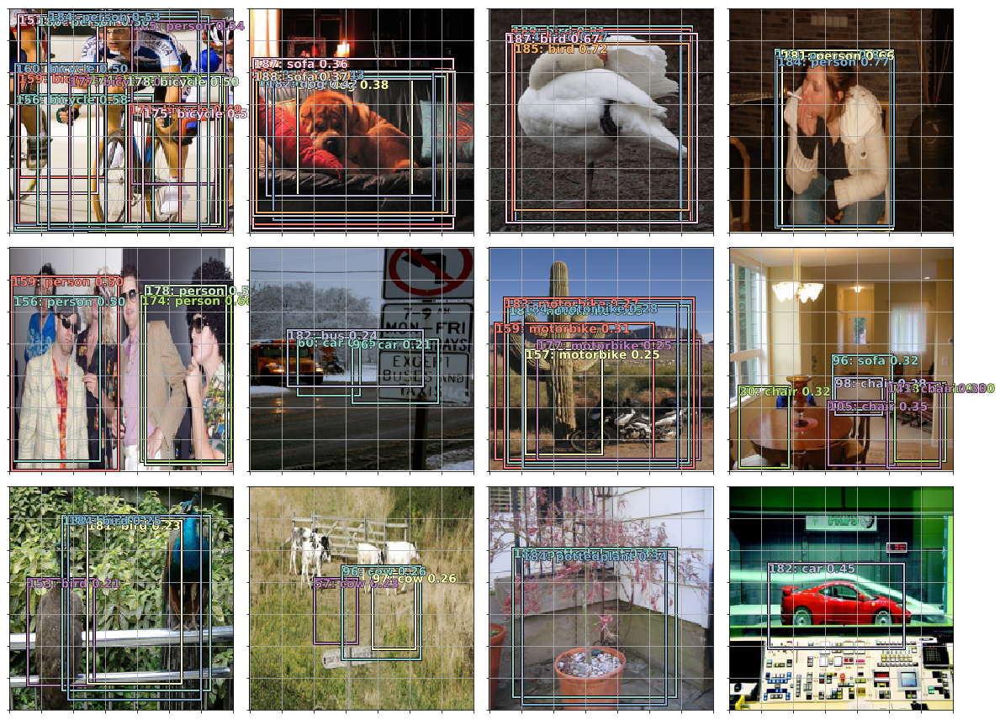

In [74]:
plot_results(0.8)

### NMS

In [45]:
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

In [46]:
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

In [79]:
idx=1
ima=md.val_ds.ds.denorm(x)[idx]
bbox,clas = get_y(y[0][idx], y[1][idx])
a_ic = actn_to_bb(b_bb[idx], anchors)
clas_pr, clas_ids = b_clas[idx].max(1)
clas_pr = clas_pr.sigmoid()

conf_scores = b_clas[idx].sigmoid().t().data

In [80]:
out1,out2,cc = [],[],[]
for cl in range(0, len(conf_scores)-1):
    c_mask = conf_scores[cl] > 0.25
    if c_mask.sum() == 0: continue
    scores = conf_scores[cl][c_mask]
    l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
    boxes = a_ic[l_mask].view(-1, 4)
    ids, count = nms(boxes.data, scores, 0.4, 50)
    ids = ids[:count]
    out1.append(scores[ids])
    out2.append(boxes.data[ids])
    cc.append([cl]*count)
cc = T(np.concatenate(cc))
out1 = torch.cat(out1)
out2 = torch.cat(out2)

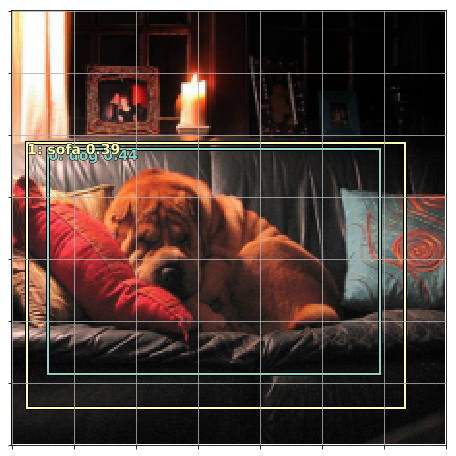

In [81]:
fig, ax = plt.subplots(figsize=(8,8))
torch_gt(ax, ima, out2, cc, out1, 0.1)

## End